In [94]:
import pandas as pd

# List of file names
file_names = ['ch01_eeg_features_label.csv', 'ch02_eeg_features_label.csv', 'ch03_eeg_features_label.csv', 'ch04_eeg_features_label.csv', 'ch06_eeg_features_label.csv', 'ch07_eeg_features_label.csv']

# Create an empty list to store the data frames
data_frames = []

# Read each CSV file and store it as a data frame
for file_name in file_names:
    df = pd.read_csv(file_name)
    data_frames.append(df)

In [95]:
# Add a new column for patient ID in each data frame
patient_ids = ['ch01', 'ch02', 'ch03', 'ch04', 'ch06', 'ch07']

for i, df in enumerate(data_frames):
    df['PatientID'] = patient_ids[i]

In [96]:
# Concatenate the data frames into a single data frame
merged_df = pd.concat(data_frames)

In [97]:
# Save the merged data frame to a new CSV file
merged_df.to_csv('merged_data.csv', index=False)

In [98]:
data=pd.read_csv('/content/merged_data.csv')
data.head()

,DFA_channel1,Fisher_Information_channel1,HFD_channel1,PFD_channel1,SVD_Entropy_channel1,variance_channel1,std_deviation_channel1,mean_channel1,fft_variance_channel1,fft_std_deviation_channel1,...,variance_channel2,std_deviation_channel2,mean_channel2,fft_variance_channel2,fft_std_deviation_channel2,fft2_variance_channel2,zero_crossing_rate_channel2,complexity_channel2,label,PatientID
0,-2.340418,-2.444332,1.919123,2.004789,0.059164,0.067505,0.661914,0.652315,1.919123,2.004789,...,0.001094,0.000793,0.000003,6.744717e-07,52.0,56.0,0.001083,0.000779,1.0,ch01
1,-2.370066,-2.457359,1.933954,2.072673,0.140508,0.108550,0.632009,0.637723,1.933954,2.072673,...,0.001116,0.000636,0.000002,5.726524e-07,50.0,62.0,0.001167,0.000405,1.0,ch01
2,-2.417069,-2.342087,1.616646,1.613469,0.057907,0.059816,0.658532,0.652315,1.616646,1.613469,...,0.001636,0.001987,0.000010,2.349343e-06,22.0,34.0,0.003095,0.006070,1.0,ch01
3,-2.345681,-2.260865,2.074892,1.905959,0.279197,0.228970,0.614835,0.622714,2.074892,1.905959,...,0.001425,0.001751,0.000007,1.835025e-06,80.0,46.0,0.002409,0.003668,1.0,ch01
4,-2.414445,-2.275812,1.825687,1.826842,0.226320,0.141556,0.622150,0.636237,1.825687,1.826842,...,0.001751,0.001552,0.000008,2.231318e-06,72.0,44.0,0.002179,0.002717,1.0,ch01


In [99]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7704 entries, 0 to 7703
Data columns (total 28 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   DFA_channel1                 7704 non-null   float64
 1   Fisher_Information_channel1  7704 non-null   float64
 2   HFD_channel1                 7704 non-null   float64
 3   PFD_channel1                 7704 non-null   float64
 4   SVD_Entropy_channel1         7704 non-null   float64
 5   variance_channel1            7704 non-null   float64
 6   std_deviation_channel1       7704 non-null   float64
 7   mean_channel1                7704 non-null   float64
 8   fft_variance_channel1        7704 non-null   float64
 9   fft_std_deviation_channel1   7704 non-null   float64
 10  fft2_variance_channel1       7704 non-null   float64
 11  zero_crossing_rate_channel1  7704 non-null   float64
 12  complexity_channel1          7704 non-null   float64
 13  DFA_channel2      

In [100]:
# Check for missing values
merged_df.isnull().sum()

# Drop rows with missing values
merged_df = merged_df.dropna()

# Impute missing values if exists
merged_df = merged_df.fillna(merged_df.mean())

<ipython-input-100-1c18687ea1c1>:8: FutureWarning: The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  merged_df = merged_df.fillna(merged_df.mean())


In [101]:
merged_df.sample(5)

,DFA_channel1,Fisher_Information_channel1,HFD_channel1,PFD_channel1,SVD_Entropy_channel1,variance_channel1,std_deviation_channel1,mean_channel1,fft_variance_channel1,fft_std_deviation_channel1,...,variance_channel2,std_deviation_channel2,mean_channel2,fft_variance_channel2,fft_std_deviation_channel2,fft2_variance_channel2,zero_crossing_rate_channel2,complexity_channel2,label,PatientID
257,-2.467342,-2.498586,1.833332,1.641769,0.058753,0.065774,0.658532,0.646715,1.833332,1.641769,...,0.000871,0.001392,3.115543e-06,1.754264e-06,44.0,30.0,0.000688,0.002337,0.0,ch01
805,-2.591908,-2.583424,2.243463,2.171990,0.221386,0.230030,0.616820,0.614835,2.243463,2.171990,...,0.000444,0.000538,2.994325e-07,4.922231e-07,144.0,92.0,0.000208,0.000268,0.0,ch02
32,-2.528979,-2.498783,1.860144,1.908663,0.089196,0.108098,0.644114,0.634081,1.860144,1.908663,...,0.000657,0.000665,1.161214e-06,4.173031e-07,32.0,52.0,0.000327,0.000360,1.0,ch04
1911,-2.694296,-2.846010,1.879084,2.117191,0.164156,0.274568,0.612925,0.606347,1.879084,2.117191,...,0.000459,0.000238,3.237898e-07,1.476360e-07,40.0,80.0,0.000193,0.000050,0.0,ch03
606,-2.877316,-2.851179,1.987545,2.025257,0.180019,0.161030,0.623862,0.626237,1.987545,2.025257,...,0.000224,0.000232,1.409805e-07,3.805368e-08,64.0,58.0,0.000055,0.000061,0.0,ch03


In [102]:
# Check for duplicate rows
duplicates = merged_df.duplicated()
merged_df[duplicates]

# Remove duplicate rows
merged_df = merged_df.drop_duplicates()

In [103]:
data.isnull().sum()

DFA_channel1                   0
Fisher_Information_channel1    0
HFD_channel1                   0
PFD_channel1                   0
SVD_Entropy_channel1           0
variance_channel1              0
std_deviation_channel1         0
mean_channel1                  0
fft_variance_channel1          0
fft_std_deviation_channel1     0
fft2_variance_channel1         0
zero_crossing_rate_channel1    0
complexity_channel1            0
DFA_channel2                   0
Fisher_Information_channel2    0
HFD_channel2                   0
PFD_channel2                   0
SVD_Entropy_channel2           0
variance_channel2              0
std_deviation_channel2         0
mean_channel2                  0
fft_variance_channel2          0
fft_std_deviation_channel2     0
fft2_variance_channel2         0
zero_crossing_rate_channel2    0
complexity_channel2            0
label                          0
PatientID                      0
dtype: int64

In [104]:
data.shape

(7704, 28)

In [105]:
data.drop_duplicates()

,DFA_channel1,Fisher_Information_channel1,HFD_channel1,PFD_channel1,SVD_Entropy_channel1,variance_channel1,std_deviation_channel1,mean_channel1,fft_variance_channel1,fft_std_deviation_channel1,...,variance_channel2,std_deviation_channel2,mean_channel2,fft_variance_channel2,fft_std_deviation_channel2,fft2_variance_channel2,zero_crossing_rate_channel2,complexity_channel2,label,PatientID
0,-2.340418,-2.444332,1.919123,2.004789,0.059164,0.067505,0.661914,0.652315,1.919123,2.004789,...,0.001094,0.000793,2.536585e-06,6.744717e-07,52.0,56.0,0.001083,0.000779,1.0,ch01
1,-2.370066,-2.457359,1.933954,2.072673,0.140508,0.108550,0.632009,0.637723,1.933954,2.072673,...,0.001116,0.000636,2.174405e-06,5.726524e-07,50.0,62.0,0.001167,0.000405,1.0,ch01
2,-2.417069,-2.342087,1.616646,1.613469,0.057907,0.059816,0.658532,0.652315,1.616646,1.613469,...,0.001636,0.001987,9.964994e-06,2.349343e-06,22.0,34.0,0.003095,0.006070,1.0,ch01
3,-2.345681,-2.260865,2.074892,1.905959,0.279197,0.228970,0.614835,0.622714,2.074892,1.905959,...,0.001425,0.001751,7.032019e-06,1.835025e-06,80.0,46.0,0.002409,0.003668,1.0,ch01
4,-2.414445,-2.275812,1.825687,1.826842,0.226320,0.141556,0.622150,0.636237,1.825687,1.826842,...,0.001751,0.001552,7.683938e-06,2.231318e-06,72.0,44.0,0.002179,0.002717,1.0,ch01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7699,-2.342019,-2.384629,2.216865,2.137276,0.324881,0.295197,0.609309,0.609309,2.216865,2.137276,...,0.002020,0.001934,6.762124e-06,5.114564e-06,122.0,114.0,0.002999,0.003308,0.0,ch07
7700,-2.502602,-2.514351,1.862039,1.796992,0.118677,0.145129,0.637723,0.635509,1.862039,1.796992,...,0.000816,0.000934,1.626883e-06,1.124531e-06,34.0,36.0,0.000473,0.000681,0.0,ch07
7701,-2.771584,-2.841109,2.240956,2.226544,0.278462,0.312322,0.610189,0.609309,2.240956,2.226544,...,0.000272,0.000352,1.648125e-07,1.034813e-07,136.0,152.0,0.000056,0.000093,0.0,ch07
7702,-2.718322,-2.572796,2.263167,2.134653,0.280109,0.237500,0.610634,0.610189,2.263167,2.134653,...,0.000362,0.000524,5.040957e-07,1.262994e-07,140.0,86.0,0.000109,0.000261,0.0,ch07


In [106]:
data.shape

(7704, 28)

In [107]:
data.describe()

,DFA_channel1,Fisher_Information_channel1,HFD_channel1,PFD_channel1,SVD_Entropy_channel1,variance_channel1,std_deviation_channel1,mean_channel1,fft_variance_channel1,fft_std_deviation_channel1,...,SVD_Entropy_channel2,variance_channel2,std_deviation_channel2,mean_channel2,fft_variance_channel2,fft_std_deviation_channel2,fft2_variance_channel2,zero_crossing_rate_channel2,complexity_channel2,label
count,7704.000000,7704.000000,7704.000000,7704.000000,7704.000000,7704.000000,7704.000000,7704.000000,7704.000000,7704.000000,...,7.704000e+03,7704.000000,7704.000000,7.704000e+03,7.704000e+03,7704.000000,7704.000000,7704.000000,7704.000000,7704.000000
mean,-2.525777,-2.533695,1.978082,1.968282,0.202095,0.189594,0.624324,0.625652,1.978082,1.968282,...,2.136967e-06,0.001199,0.001088,5.129603e-06,3.456419e-06,88.452752,82.658619,0.002825,0.002113,0.102804
std,0.224644,0.215405,0.230424,0.237223,0.099909,0.091708,0.017598,0.017279,0.230424,0.237223,...,5.357816e-06,0.001184,0.000976,1.315448e-05,7.985485e-06,65.851990,59.644494,0.007471,0.005581,0.303722
min,-3.086428,-3.062093,0.893361,0.782839,0.021168,0.020126,0.583548,0.585630,0.893361,0.782839,...,1.202586e-08,0.000113,0.000110,2.427759e-08,1.276139e-08,0.000000,0.000000,0.000011,0.000009,0.000000
25%,-2.701437,-2.699057,1.837734,1.821238,0.119587,0.112170,0.611084,0.612458,1.837734,1.821238,...,2.138630e-07,0.000440,0.000462,3.845185e-07,2.760195e-07,42.000000,42.000000,0.000171,0.000182,0.000000
50%,-2.554071,-2.527727,2.017974,1.995545,0.201791,0.186195,0.619416,0.621039,2.017974,1.995545,...,6.850609e-07,0.000788,0.000828,1.193650e-06,1.041663e-06,68.000000,66.000000,0.000541,0.000602,0.000000
75%,-2.359391,-2.391818,2.167198,2.174506,0.278339,0.261847,0.634081,0.636237,2.167198,2.174506,...,1.826446e-06,0.001499,0.001351,3.754900e-06,3.723930e-06,118.000000,108.000000,0.002119,0.001738,0.000000
max,-1.740832,-1.664254,2.299080,2.297349,0.530400,0.554342,0.699415,0.713787,2.299080,2.297349,...,2.367347e-04,0.014316,0.015386,3.154852e-04,2.395437e-04,354.000000,344.000000,0.202286,0.241940,1.000000


In [108]:
df.dtypes

DFA_channel1                   float64
Fisher_Information_channel1    float64
HFD_channel1                   float64
PFD_channel1                   float64
SVD_Entropy_channel1           float64
variance_channel1              float64
std_deviation_channel1         float64
mean_channel1                  float64
fft_variance_channel1          float64
fft_std_deviation_channel1     float64
fft2_variance_channel1         float64
zero_crossing_rate_channel1    float64
complexity_channel1            float64
DFA_channel2                   float64
Fisher_Information_channel2    float64
HFD_channel2                   float64
PFD_channel2                   float64
SVD_Entropy_channel2           float64
variance_channel2              float64
std_deviation_channel2         float64
mean_channel2                  float64
fft_variance_channel2          float64
fft_std_deviation_channel2     float64
fft2_variance_channel2         float64
zero_crossing_rate_channel2    float64
complexity_channel2      

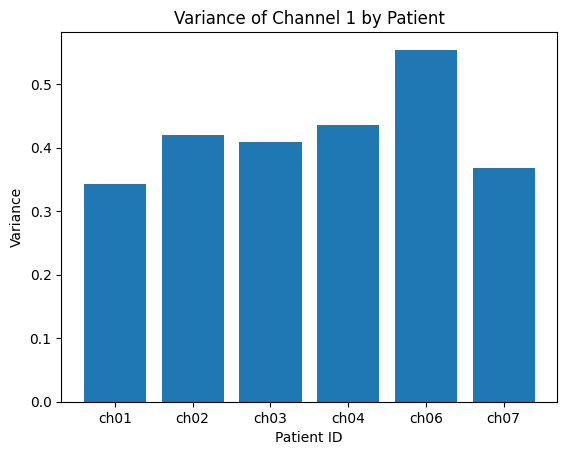

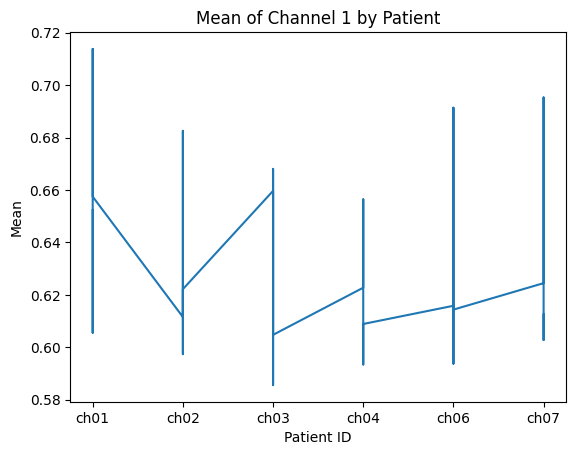

In [109]:
import matplotlib.pyplot as plt

# Plot a bar chart
plt.bar(merged_df['PatientID'], merged_df['variance_channel1'])
plt.xlabel('Patient ID')
plt.ylabel('Variance')
plt.title('Variance of Channel 1 by Patient')
plt.show()
# Plot a line chart
plt.plot(merged_df['PatientID'], merged_df['mean_channel1'])
plt.xlabel('Patient ID')
plt.ylabel('Mean')
plt.title('Mean of Channel 1 by Patient')
plt.show()

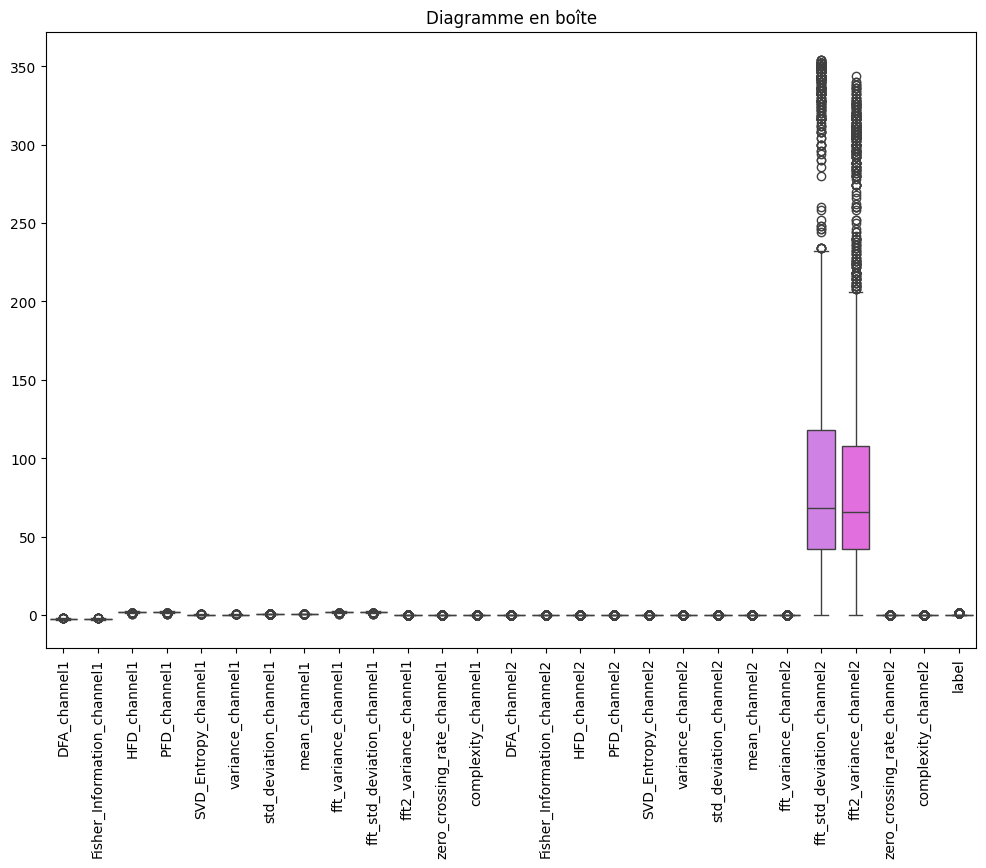

In [110]:
import seaborn as sns
plt.figure(figsize=(12, 8))
sns.boxplot(data=data)
plt.title("Diagramme en boîte")
plt.xticks(rotation=90)
plt.show()

In [111]:
# Calculer les limites inférieure et supérieure pour chaque fonctionnalité
Q1 = data.quantile(0.25)
Q3 = data.quantile(0.75)
IQR = Q3 - Q1

lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Filtrer les lignes avec des valeurs aberrantes
data = data[((data >= lower_bound) & (data <= upper_bound)).all(axis=1)]


<ipython-input-111-92aca344f114>:2: FutureWarning: The default value of numeric_only in DataFrame.quantile is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  Q1 = data.quantile(0.25)
<ipython-input-111-92aca344f114>:3: FutureWarning: The default value of numeric_only in DataFrame.quantile is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  Q3 = data.quantile(0.75)
<ipython-input-111-92aca344f114>:10: FutureWarning: Automatic reindexing on DataFrame vs Series comparisons is deprecated and will raise ValueError in a future version. Do `left, right = left.align(right, axis=1, copy=False)` before e.g. `left == right`
  data = data[((data >= lower_bound) & (data <= upper_bound)).all(axis=1)]


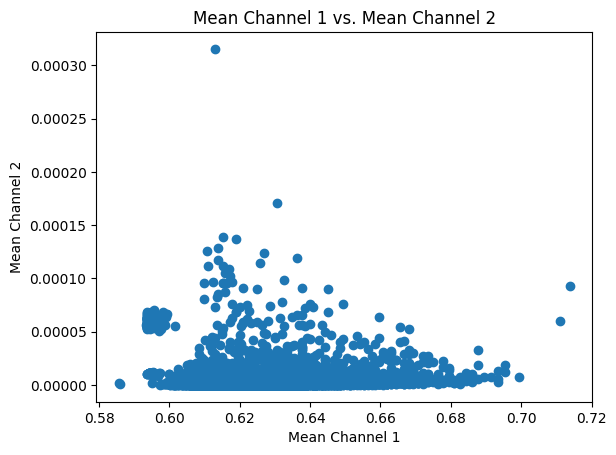

In [112]:
# Plot a scatter plot
plt.scatter(merged_df['mean_channel1'], merged_df['mean_channel2'])
plt.xlabel('Mean Channel 1')
plt.ylabel('Mean Channel 2')
plt.title('Mean Channel 1 vs. Mean Channel 2')
plt.show()

<ipython-input-113-c91bf500ed48>:4: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation_matrix = merged_df.corr()


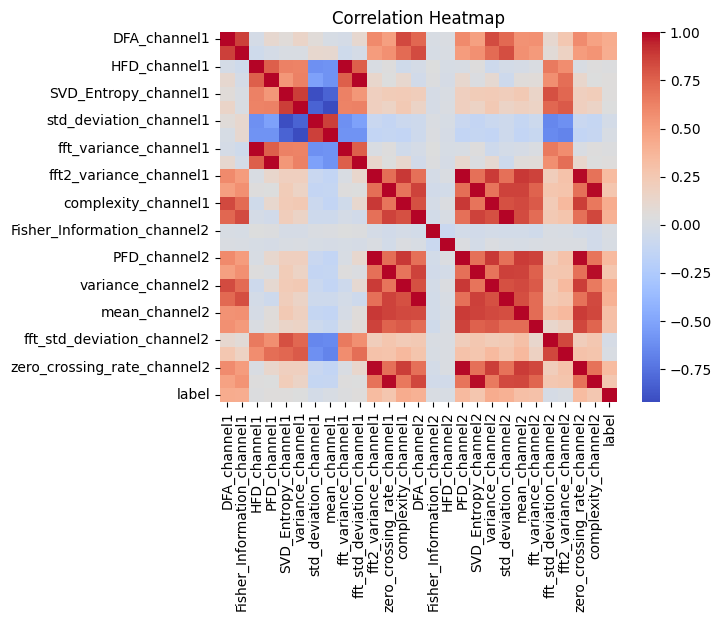

In [113]:
import seaborn as sns

# Create a correlation matrix
correlation_matrix = merged_df.corr()

# Plot a correlation heatmap
sns.heatmap(correlation_matrix, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Heatmap')
plt.show()

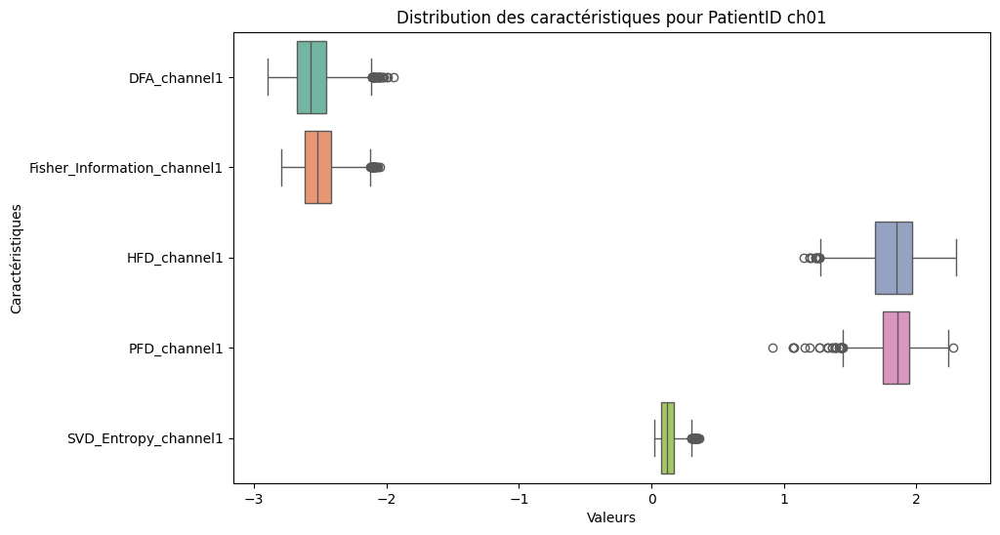

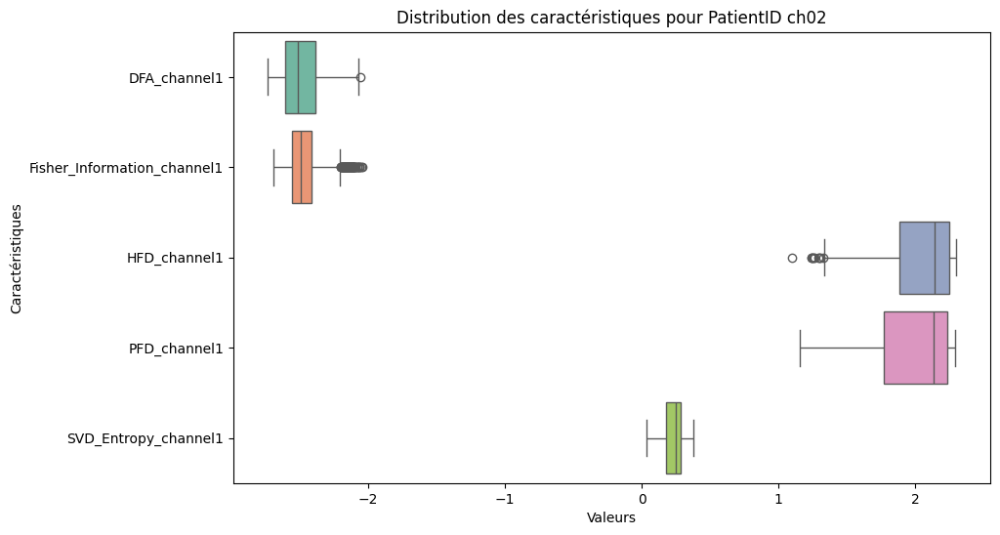

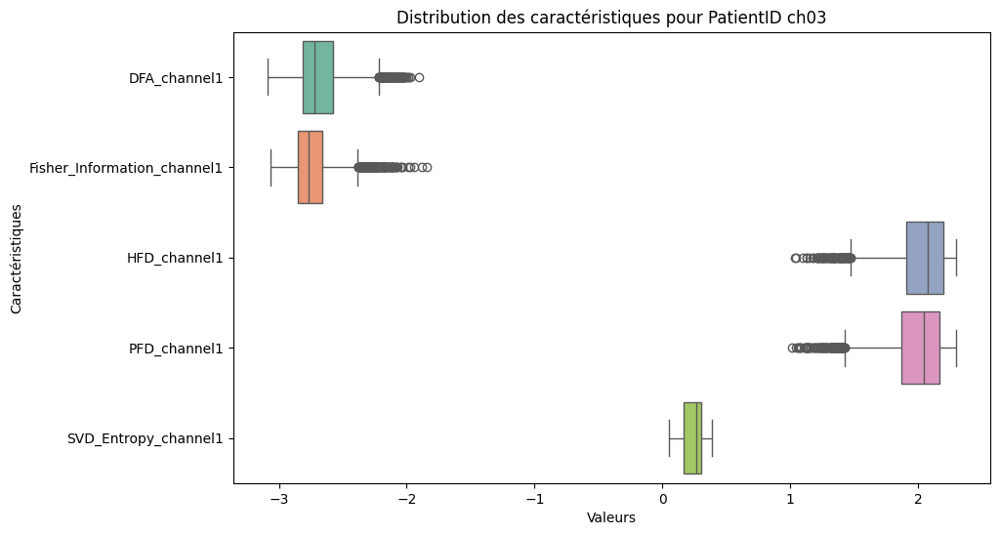

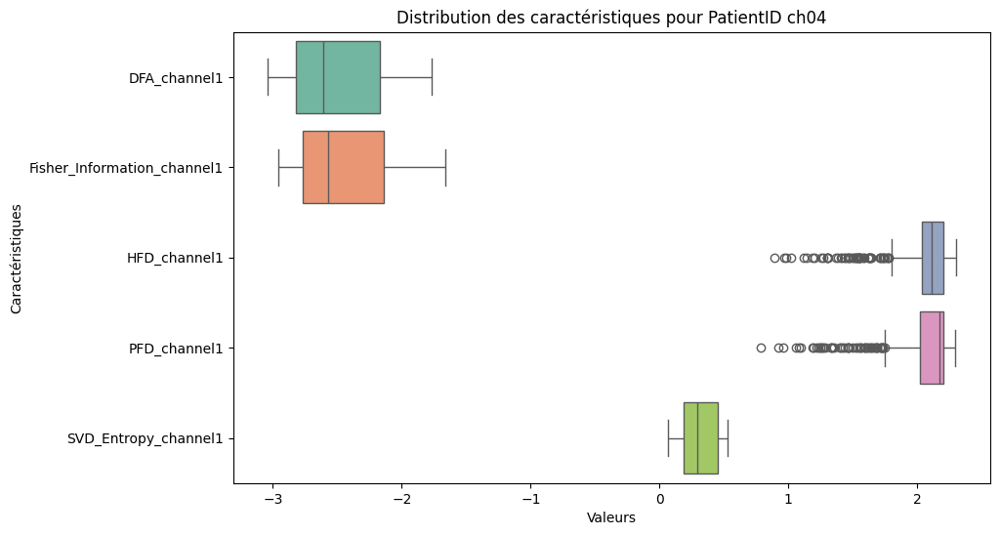

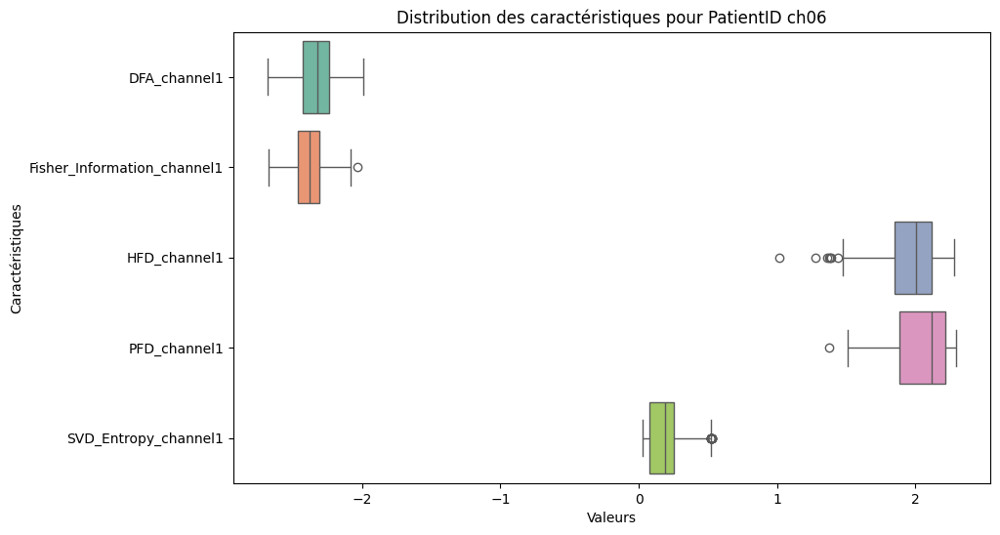

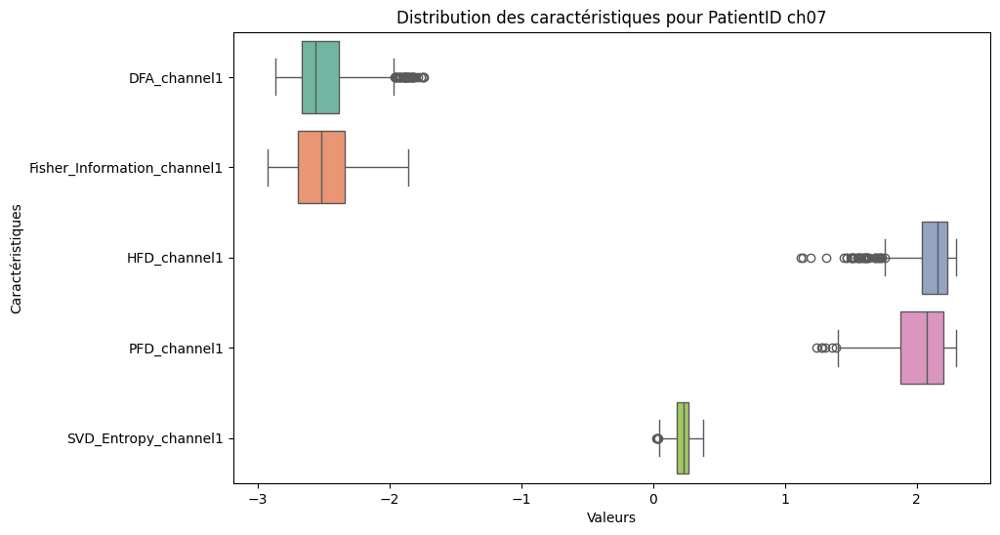

In [114]:
import seaborn as sns
import matplotlib.pyplot as plt


# Définir les colonnes à visualiser
columns_to_visualize = ['DFA_channel1', 'Fisher_Information_channel1', 'HFD_channel1', 'PFD_channel1', 'SVD_Entropy_channel1']

# Boucle sur chaque PatientID
for patient_id, df_patient in merged_df.groupby('PatientID'):
    # Sélectionner les données du patient actuel
    df_patient = df_patient[columns_to_visualize]

    # Tracer les boxplots pour chaque colonne
    plt.figure(figsize=(10, 6))
    sns.boxplot(data=df_patient, orient='h', palette='Set2')
    plt.title(f'Distribution des caractéristiques pour PatientID {patient_id}')
    plt.xlabel('Valeurs')
    plt.ylabel('Caractéristiques')
    plt.show()


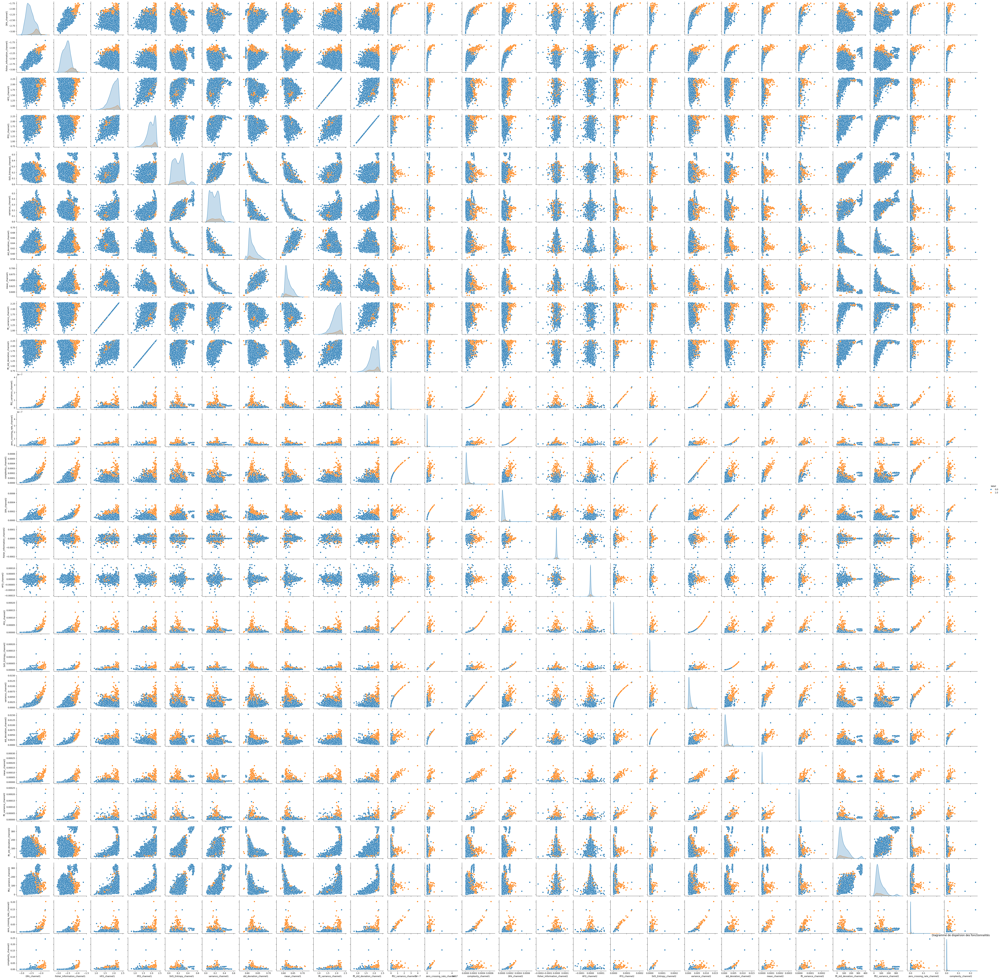

In [117]:
sns.pairplot(data=merged_df, hue='label')
plt.title("Diagramme de dispersion des fonctionnalités")
plt.show()


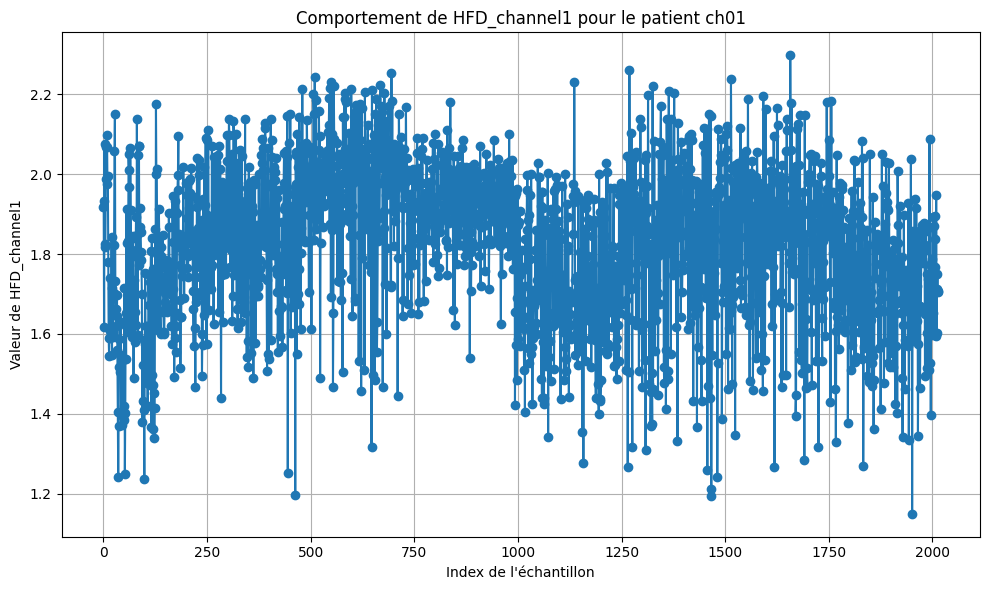

In [116]:
import matplotlib.pyplot as plt

# Extraire les données pour le patient ayant l'ID 'ch01' et la colonne 'HFD_channel1'
patient_data = merged_df[merged_df['PatientID'] == 'ch01']
hfd_channel1_data = patient_data['HFD_channel1']

# Créer un graphique pour visualiser les données
plt.figure(figsize=(10, 6))
plt.plot(hfd_channel1_data, marker='o', linestyle='-')
plt.title('Comportement de HFD_channel1 pour le patient ch01')
plt.xlabel('Index de l\'échantillon')
plt.ylabel('Valeur de HFD_channel1')
plt.grid(True)
plt.tight_layout()
plt.show()
